# Interactive DataMapPlot Colour Options

This notebook will walk you through some of the colour specific customization options that are available in DataMapPlot interactive plots. There are many options, so this notebook will instead highlight some of the major options and hint at the further customization that can be achieved with respect to them. To get started we’ll need to import DataMapPlot.

In [1]:
import datamapplot

To demonstrate what DataMapPlot interactive plots can do we’ll need some data. The examples directory of the DataMapPlot repository contains some pre-prepared datasets for experimenting with. We’ll grab one of those. Much like the static plotting we need a data map – as set of 2d coordinates, one per data sample we are mapping – and at least one set of labels idenityfing the “topic” of a data sample, usually based on clusters in the data map. In this case we’ll use a data map derived from the CORD-19 dataset – a dataset of papers and scientific articles related to COVID-19 that was curated by Allen AI.

In [2]:
import numpy as np
import requests
import io

base_url = "https://github.com/TutteInstitute/datamapplot"
data_map_file = requests.get(
    f"{base_url}/raw/main/examples/CORD19-subset-data-map.npz"
)
cord19_data_map = np.load(io.BytesIO(data_map_file.content))["arr_0"]
label_file = requests.get(
    f"{base_url}/raw/interactive/examples/CORD19-subset-cluster_labels.npz"
)
cord19_labels = np.load(io.BytesIO(label_file.content), allow_pickle=True)["arr_0"]

Let’s start by making a basic interactive plot with DataMapPlot. This will give us an idea of what the starting point looks like, and can better understand what the various customizations we will be applying can do for us.

In [3]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
)
plot

<InteractiveFigure width=100% height=800>

Similarly to the static plots, by default interactive plots in DataMapPlot colour the text labels to match with the associated clusters in the data map. This can be useful for distinguishing the different labels, and making the cluster associations, but can be distracting. We can turn that off by setting ``color_label_text`` to ``False``.

In [4]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    color_label_text=False,
)
plot

<InteractiveFigure width=100% height=800>

In contrast to the static plots, the interactive plotting supports drawing cluster boundaries (using berzier smoothed alpha-shapes). This can be particularly helpful when there are multiple layers of clusters as the smaller fine grained clusters can be picked out by their boundaries. Much like the labels the default is to have these cluster boundaries drawn in colour, with the colour designed to match with the cluster colour. To see this lets add the cluster boundaries (and increase the line-width to make them more visible):

In [5]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    cluster_boundary_polygons=True,
    cluster_boundary_line_width=8,
)
plot

<InteractiveFigure width=100% height=800>

Similarly to the labels we can turn this effect off by setting ``color_cluster_boundaries`` to ``False``:

In [6]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    cluster_boundary_polygons=True,
    cluster_boundary_line_width=8,
    color_label_text=False,
    color_cluster_boundaries=False,
)
plot

<InteractiveFigure width=100% height=800>

The interactive plotting for DataMapPlot also supports setting a background colour out-of-box: simply use the ``background_color`` keyword and provide a hex-string colour code.

In [7]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    background_color="#eeeeee",
)
plot

<InteractiveFigure width=100% height=800>

Of course if you want a dark background that changes things -- now the label colours need to be paler or pastel versions the cluster colours, with black outlines, and any title text needs to white not black and ... that's a lot of things to set by hand. Fortunately you can set ``darkmode=True`` and have all of this handled for you.

In [8]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    darkmode=True,
)
plot

<InteractiveFigure width=100% height=800>

As with the static plots, DataMapPlot generates a default color palette designed to have nearby clusters have similar colours. It is possible to replace this colour generated palette with your own, as we’ll see later, but for now let’s look at some of the options for tweaking this auto-generated colour palette. By default red hue end up at the left, or west, side of the map. You can shift this around via the palette_hue_shift which takes an argument, in degrees clockwise, of how far to shift the hue of the palette around. For example, if we shift the hue by -90 we will end up with the red hues at the bottom, or south, side of the map.

In [9]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    palette_hue_shift=-90,
)
plot

<InteractiveFigure width=100% height=800>

While rotating the palette around doesn’t have a dramatic effect, it can allow some degree of control, especially since the exact palette generated is data driven, and shifting the hue can help to emphasise or de-emphasise clusters as you see fit.

The interactive plots also support ``palette_hue_radius_dependence`` just as with the static plots (see the static plot colour options for more details and examples). The interactive plots also support using your own palettes, just like the static plots. We can use continuous matplotlib cmaps like viridis: 

In [10]:
from matplotlib.cm import viridis
from IPython.display import display_png

You can see the linear colour map here:

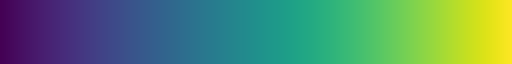

In [11]:
display_png(viridis)

Applying it to the plot works just like the static plots: use the ``cmap`` keyword and provide a callable matplotlib colormap. The palette generation will handle the rest -- including refledcting the linear palette to make it circular.

In [12]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    cmap=viridis,
)
plot

<InteractiveFigure width=100% height=800>

If, on the other hand, we actually provide a true cyclic cmap it will work directly with that. A good source of cyclic colour maps (aside from the few provided in matplotlib) is the [colorcet package](https://colorcet.holoviz.org/). Let’s import that so we can use a cyclic example.

In [13]:
import colorcet

The colorcet package provides a number of cmaps, but let’s use one of the basic cyclic ones – the colorwheel cmap.

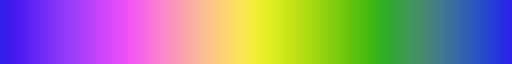

In [14]:
display_png(colorcet.cm.colorwheel)

And we can simply drop that in as our desired ``cmap`` and DataMapPlot will detect that it is cyclic and use it directly, without applying relfections.

In [15]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    cmap=colorcet.cm.colorwheel,
)
plot

<InteractiveFigure width=100% height=800>

As you can see we get a good looking result with a custom colour palette – but it is still generating a palette from the colorwheel cmap. What if we want more control over the colours used?

For that case you can explicitly provide your own colour mapping from cluster labels to colours. To demonstrate that let’s import seaborn to generate a palette of the right size, and get the rgb2hex function from matplotlib since DataMapPlot wants all colours as hex-strings and not the sRGB1 triples that seaborn provides by default.

In [16]:
import seaborn as sns
from matplotlib.colors import rgb2hex
import pandas as pd

We can then construct our mapping as a dictionary from (unique!) cluster labels names to colours from the palette we wish to use. Here we'll select the ``tab20`` categorical palette available from matplotlib.

In [17]:
all_labels = np.unique(cord19_labels)
custom_color_map = dict(
    zip(
        np.unique(all_labels),
        map(rgb2hex, sns.color_palette("tab20", len(all_labels)))
    )
)
custom_color_map["Unlabelled"] = "#cccccc"

We apply this to plot by providing this mapping as the ``label_color_map``, just as we would with the static plots. Handling the colours for the labels and cluster boundaries will all happen automatically, as generated based on the ``kabel_color_map`` that you supply.

In [18]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    label_color_map=custom_color_map,
    cluster_boundary_polygons=True,
    cluster_boundary_line_width=8,
)
plot

<InteractiveFigure width=100% height=800>

All of this presumes, however, that you wish to colour points by clusters (and labels). Perhaps you have some entirely different data that you wish to colour points by, but still want to th text labels to pick out and describe differtent regions of the data map. This is also possible, but it does defintiely require a little more work on your part. This next section will step you through the process with an example on the CORD-19 data where we wish to colur points by the primary field of study that the research paper comes from. To do that we’ll have to start with that data – which is available in the examples directory of the DataMapPlot repository.

In [19]:
field_file = requests.get(
    "https://github.com/TutteInstitute/datamapplot/raw/main/examples/CORD19-subset-field_of_study.npz"
)
research_field = np.load(io.BytesIO(field_file.content), allow_pickle=True)["arr_0"]

Now we need a custom colour mapping from fields of research to colours; we want similar fields to have similar(ish) colours, so let’s build a custom palette for that.

In [20]:
color_mapping = {}
color_mapping["Medicine"] = "#aaaaaa"
for key, color in zip(("Biology", "Chemistry", "Physics"), sns.color_palette("YlOrRd_r", 3)):
    color_mapping[key] = rgb2hex(color)
for key, color in zip(("Business", "Economics", "Political Science"), sns.color_palette("BuPu_r", 3)):
    color_mapping[key] = rgb2hex(color)
for key, color in zip(("Psychology", "Sociology", "Geography", "History"), sns.color_palette("YlGnBu_r", 4)):
    color_mapping[key] = rgb2hex(color)
for key, color in zip(("Computer Science", "Engineering", "Mathematics"), sns.color_palette("light:teal_r", 4)[:-1]):
    color_mapping[key] = rgb2hex(color)
for key, color in zip(("Environmental Science", "Geology", "Materials Science"), sns.color_palette("pink", 3), ):
    color_mapping[key] = rgb2hex(color)
for key, color in zip(("Art", "Philosophy", "Unknown"), sns.color_palette("bone", 3)):
    color_mapping[key] = rgb2hex(color)

Having built a palette, we need to apply that to the different research fields to arrive at an array with a colour per point – similar to the marker_size_array from the sizing options tutorial, but this time with colours.

In [21]:
marker_color_array = pd.Series(research_field).map(color_mapping).values

Now it is simply a matter of passing this in the create_plot using the marker_color_array keyword argument, and we can have the points coloured according to the colours specified in our array. Since we are using our own colours we’ll want to turn off the coloured label text (since there are no cluster colours to be matching with), and ensure cluster boundaries are also not coloured.

In [22]:
plot = datamapplot.create_interactive_plot(
    cord19_data_map,
    cord19_labels,
    initial_zoom_fraction=0.33,
    cluster_boundary_polygons=True,
    cluster_boundary_line_width=6,
    color_label_text=False,
    color_cluster_boundaries=False,
    marker_color_array=marker_color_array,
)
plot

<InteractiveFigure width=100% height=800>

There are many more minor options for further fine-tuning, but it is best to see the API documentation for those.